<a href="https://colab.research.google.com/github/Guillaume-mcgill/school/blob/main/ECSE415_Assignment2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ECSE 415: ASSIGNMENT 2**

NAME: GUILLAUME RODIER

ID: 260975661

***IMPORTED LIBRARIES***

In [ ]:
# google drive
from google.colab import drive

# Open CV
import cv2

# numpy
import numpy as np

# matplotlib (for graphs)
import matplotlib.pyplot as plt

# Sci-kit learn
from sklearn.neighbors import KNeighborsClassifier

# for visualization only of the HoG features
from skimage.feature import hog

# for dataset import in question 3
import os

%matplotlib inline

In [ ]:
drive.mount('/content/drive')

# Define the path variable
path = '/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/'

# **1. Image Classification using HoG**

This ressource was used as an aid to get more details on the different steps involved in HoG:

https://github.com/udacity/CVND_Exercises/blob/master/1_4_Feature_Vectors/3_1.%20HOG.ipynb

In [ ]:
# function to load the images in an array
def image_array(location, numb_img, format, start_index=0):

  empty_list = []
  for i in range(start_index, numb_img):
    empty_list.append(cv2.imread('{0}{1}{2}.{3}'.format(path,location,i+1,format)))
    print('{0}{1}{2}.{3}'.format(path,location,i+1,format))
  return empty_list

# relative paths to the path variable
location_kraft = 'Q1/training/kraft_train'
location_mcdo = 'Q1/training/mc_train'

# store the kraft and mcdo images
kraft_images = image_array(location_kraft,5,'jpeg')
mcdo_images = image_array(location_mcdo,5,'jpeg')

/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/kraft_train1.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/kraft_train2.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/kraft_train3.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/kraft_train4.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/kraft_train5.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/mc_train1.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/mc_train2.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/mc_train3.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/mc_train4.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/training/mc_train5.jpeg


***1.1.1 Resize the training images***

In [ ]:
 # resize the images and switch to grayscale
def resize_images(image_array):

  for i in range(len(image_array)):
    image_array[i] = cv2.resize(image_array[i], (128,128), interpolation = cv2.INTER_LINEAR)
    image_array[i] = cv2.cvtColor(image_array[i], cv2.COLOR_BGR2GRAY)
  return image_array

# resized images
kraft_images = resize_images(kraft_images)
mcdo_images = resize_images(mcdo_images)

***1.1.2 Compute HoG features for all training images***

In [ ]:
# the course notes were used for this function as well as the openCV website.
# The steps for HoG are:

#     1. compute the gradients
#     2. accumulate weighted votes for gradient orientations over spatial cells
#     3. Normalize the contrast within overlapping blocks of cells
#     4. Collect HoGs for all blocks over the detection window

# 1. compute the gradients with a sobel filter
def compute_gradients_param(image_array):

  # store the gradients for each image in the input array
  gradients_param = [None]*len(image_array)

  # iterate over each input image
  for i in range(len(image_array)):

    # get the intensities, phases, magnitudes
    I_x, I_y = (cv2.Sobel(image_array[i], cv2.CV_64F, 1, 0, ksize=3), cv2.Sobel(image_array[i], cv2.CV_64F, 0, 1, ksize=3))
    magnitude = cv2.magnitude(I_x, I_y)
    phase = np.arctan2(I_x,I_y)*180/np.pi

    # avoid negative angles
    phase = np.where(phase<0, phase+180, phase)

    # create an array of tuples for the gradients magnitudes and orientations for each image
    gradients_param[i] = (magnitude, phase)

  return gradients_param

*(1) get the orientations and phases of the gradients*

In [ ]:
# Call the function detailed above

kraft_gradients_param = compute_gradients_param(kraft_images)
mcdo_gradients_param = compute_gradients_param(mcdo_images)

In [ ]:
# SANITY CHECK: look if there are any NaN values in the arrays

print(np.isnan(np.array(kraft_gradients_param)).any())
print(np.isnan(np.array(mcdo_gradients_param)).any())

False
False


*(2) Accumulate weighted votes for gradient orientation over spatial cells*

In [ ]:
# The key idea of the weighted vote was taken from the tutorial, however, the algorithm is different

def weighted_vote(input_params):

  # list containing all the histograms (one for each training picture)
  histograms = []

  for (magnitude, phase) in input_params:

    cell_size = 4
    # number of cells that fit inside the picture
    height = magnitude.shape[0]//cell_size
    width = magnitude.shape[1]//cell_size

    # histogram has shape: height (in # cells) x width (in # of cells) x number of bins
    histogram = np.zeros((height,width,8))

    for i in range(height):
      for j in range(width):

        # fill the cells with data
        magnit = magnitude[i*cell_size:i*cell_size+cell_size, j*cell_size:j*cell_size+cell_size]
        direct = phase[i*cell_size:i*cell_size+cell_size, j*cell_size:j*cell_size+cell_size]

        # get how much it deviates from 180 degrees
        direct = direct % 180

        # define an array for the 8 bins
        direction = [0]*8

        for m in range(cell_size):
          for n in range(cell_size):

            # fill each cell with an histogram
            angle = direct[m,n]

            # 8 bins:
            if (0<angle<22.5):
              direction[0] += magnit[m,n]
            elif (22.5<angle<45):
              direction[1] += magnit[m,n]
            elif (45<angle<67.5):
              direction[2] += magnit[m,n]
            elif (67.5<angle<90):
              direction[3] += magnit[m,n]
            elif (90<angle<112.5):
              direction[4] += magnit[m,n]
            elif (112.5<angle<135):
              direction[5] += magnit[m,n]
            elif (135<angle<157.5):
              direction[6] += magnit[m,n]
            else:
              direction[7] += magnit[m,n]

        # histogram of a single picture
        histogram[i,j] = direction[:]

    # array of histograms for all the pictures
    histograms.append(histogram)

  return np.array(histograms)

In [ ]:
# store the kraft and mcdo histograms

kraft_histogram = weighted_vote(kraft_gradients_param)
mcdo_histogram = weighted_vote(mcdo_gradients_param)

# print the shapes of the histograms:

print("shape of kraft combined histogram: ",kraft_histogram.shape)
print("shape of mcdo combined histogram: ",mcdo_histogram.shape)

shape of kraft combined histogram:  (5, 32, 32, 8)
shape of mcdo combined histogram:  (5, 32, 32, 8)


In [ ]:
# SANITY CHECK: look if there are NaN values in the arrays

print(np.isnan(np.array(kraft_histogram)).any())
print(np.isnan(np.array(mcdo_histogram)).any())

False
False


***1.2.3 Apply a blocknorm in 4x4 cell neighborhoods***

In [ ]:
# information about np.nditer() was found on the numpy website:
# https://numpy.org/doc/stable/reference/generated/numpy.nditer.html
# it iterates over numbers (or objects) in arrays

def blocknorm(histograms):

  # descriptor for all the images
  hogDescriptor = []

  # iterate over the histograms of each input image
  for n in range(len(histograms)):

    # descriptor for a single image
    descriptor = []

    # iterate over all the cells in an image
    for i in range(histograms[n].shape[0]-3):
      for j in range(histograms[n].shape[1]-3):

        # a block is a 4x4 matrix of cells
        block = histograms[n,i:i+4,j:j+4]
        norm = np.linalg.norm(block)

        # avoid null divisions
        if norm!=0:
          block = block/norm

        for cell in block:
          for histogram in cell:
            for number in np.nditer(histogram):

              # add every normalized block to the image HoG descriptor
              descriptor.append(number)

    # concatenate all the descriptors of each image in one array
    hogDescriptor.append(descriptor)

  # convert to a numpy array
  hogDescriptor = np.array(hogDescriptor)
  print("shape of HoG descriptor: ",hogDescriptor.shape)
  return hogDescriptor

In [ ]:
# store the kraft and mcdo HoG descriptors

kraft_HoG_descriptor = blocknorm(kraft_histogram)
mcdo_HoG_descriptor = blocknorm(mcdo_histogram)

total_HoG_descriptor = np.concatenate((kraft_HoG_descriptor,mcdo_HoG_descriptor))

shape of HoG descriptor:  (5, 107648)
shape of HoG descriptor:  (5, 107648)


***1.2.4 Fit a nearest neighbor classifier***

In [ ]:
# use the KNeighborsClassifier library from Sklearn
# information about this library was found on the Scikit-learn website:
# https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html

classifier = KNeighborsClassifier(n_neighbors=3,weights='distance',algorithm='auto')
# kraft is 1 and mcdo is 0
y = [1,1,1,1,1,0,0,0,0,0]
classifier.fit(total_HoG_descriptor,y)

KNeighborsClassifier(n_neighbors=3, weights='distance')

# **1.2 Classify the test images**

In [ ]:
# relative paths to the test images
kraft_loc = 'Q1/test/kraft_test'
mcdo_loc = 'Q1/test/mc_test'

# store the test images
# arguments to the image_array function: location, number of images, format of image, start index

kraft_test_img = image_array(kraft_loc,1,'png')
kraft_test_img.extend(image_array(kraft_loc,2,'PNG',1))
mcdo_test_img = image_array(mcdo_loc,2,'jpeg',1)
mcdo_test_img.extend(image_array(mcdo_loc,2,'PNG',1))

/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/test/kraft_test1.png
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/test/kraft_test2.PNG
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/test/mc_test2.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q1/test/mc_test2.PNG


***1.2.1 Compute the HoG features for all the test images***

In [ ]:
# resize the images so that they are the same size as the training ones
kraft_test_img = np.array(resize_images(kraft_test_img))
mcdo_test_img = np.array(resize_images(mcdo_test_img))

# compute the gradients
kraft_test_params = compute_gradients_param(kraft_test_img)
mcdo_test_params = compute_gradients_param(mcdo_test_img)

# get the weighted votes
kraft_test_histo = weighted_vote(kraft_test_params)
mcdo_test_histo = weighted_vote(mcdo_test_params)

# compute the HoG descriptors
kraft_HoG_test = blocknorm(kraft_test_histo)
mcdo_HoG_test = blocknorm(mcdo_test_histo)

# concatenate the Kraft and McDo HoG descriptor in one
total_HoG_test = np.concatenate((kraft_HoG_test,mcdo_HoG_test))

shape of HoG descriptor:  (2, 107648)
shape of HoG descriptor:  (2, 107648)


***1.2.2 Display the HoG features for all test images***

(<Axes: >, <matplotlib.image.AxesImage at 0x7f39062d09d0>)

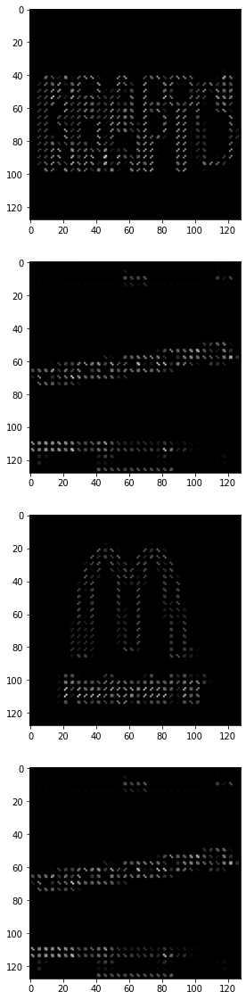

In [ ]:
# An already built Scikit-learn library was used only for visualizing the HoG features. Informations was found at the website:
# https://towardsdatascience.com/hog-histogram-of-oriented-gradients-67ecd887675f

plt.figure(figsize=(20,20))


# image 1
_, hog_image1 = hog(kraft_test_img[0], orientations=8, pixels_per_cell=(4, 4),
                    cells_per_block=(4, 4), visualize=True)

plt.subplot(411),plt.imshow(hog_image1,cmap='gray')

# image 2
_, hog_image2 = hog(kraft_test_img[1], orientations=8, pixels_per_cell=(4, 4),
                    cells_per_block=(4, 4), visualize=True)

plt.subplot(412),plt.imshow(hog_image2,cmap='gray')

# image 3
_, hog_image3 = hog(mcdo_test_img[0], orientations=8, pixels_per_cell=(4, 4),
                    cells_per_block=(4, 4), visualize=True)

plt.subplot(413),plt.imshow(hog_image3,cmap='gray')

# image 4
_, hog_image4 = hog(kraft_test_img[1], orientations=8, pixels_per_cell=(4, 4),
                    cells_per_block=(4, 4), visualize=True)

plt.subplot(414),plt.imshow(hog_image4,cmap='gray')

***1.2.3. Classify the test images using the classifier built above***

In [ ]:
# kraft = 1
# McDo = 0
# the correct output should be y = [1,1,0,0]

print("predictions: ",classifier.predict(total_HoG_test))

predictions:  [1 0 0 0]


***1.2.4 Discussion:***



Here we can observe that only 1 image is wrongly classified out of 4 (75% accuracy). The wrongly classified image was the rotated kraft image. The prediction for the rotated McDo image. on the other hand, was right.  This wrong classification of the Kraft image under rotation is expected as HoG isn't extremely performant for differences in scale and rotation in the images (HoG is better for applications where there is little change in scale such as in surveillance). SIFT here, would be a better choice for extreme rotations as SIFT orientations are calculated with respect to the dominant orientation.


Although HoG isn't as good as SIFT under rotation, one of its useful feature is that because of the different gradients orientation bins, it is able to recognize similar local appearances and shapes under different illumination conditions.

# **EXTRA: Compare with an HoG library**

In [ ]:
# this part was inspired by the tutorial and was used to compare with our previous result
# same setting are used as above

image_size = (128,128)
cell_size = (4,4)
block_size = (4,4)
nbins = 8

# create an HoG object
hog = cv2.HOGDescriptor(_winSize=(image_size[1] // cell_size[1] * cell_size[1],
                                  image_size[0] // cell_size[0] * cell_size[0]),
                        _blockSize=(block_size[1] * cell_size[1],
                                    block_size[0] * cell_size[1]),
                        _blockStride=(cell_size[1], cell_size[0]),
                        _cellSize=(cell_size[1], cell_size[0]),
                        _nbins=nbins)


# create a new classifier
test_classifier = KNeighborsClassifier(n_neighbors=3,weights='distance',algorithm='auto')
y = [1,1,1,1,1,0,0,0,0,0]


# concatenate the kraft and mcdo training images
train_images = np.array(kraft_images + mcdo_images)


# compute all the HoG features
features = []
for i in range(len(train_images)):
    features.append(hog.compute(train_images[i].astype(np.uint8)).reshape(1, -1))
features = np.vstack(features)


# fit the data to the classifier
test_classifier.fit(features,y)


# concatenate all the testing images together
test_images = np.array(kraft_test_img + mcdo_test_img)


# get the features for the testing images
test_features = []
for i in range(len(test_images)):
    test_features.append(hog.compute(train_images[i].astype(np.uint8)).reshape(1, -1))
test_features = np.vstack(test_features)


# predict the data
out = test_classifier.predict(test_features)
print(out)

[1 1 1 1]


**Extra discussion**


From the above experimentation, we can see that both the built-in HOGDescriptor and the implemented versions of HoG were not able to capture all the features to distinctiate the McDonals and Kraft images from one another. With The implemented HoG, 3 out of 4 images were predicted correctly using a 4x4 cell size, a 4x4 block size and 8 orientation bins. With the library version, all the images were predicted to be the same (2 correct predictions out of 4, resulting in an accuracy of 50%). Therefore, my version of HoG seems more robust given the set of data used here.


***Remember that HoG has some features that are useful in classifying images***:

1- It is insensitive to changes in the lighting conditions

2- Since it divides the images in small sub-regions, it is able to capture the changes in texture and shape


As mentionned previously, as opposed to SIFT, HoG isn't able to compensate for scale and is often used in conditions where the scale does not change. It is also not robust under large changes in the rotation. This is why here, SIFT would be suited as a descriptor to characterize logos that have rotated and are on different scales.

# **2. Image stitching**

***2.1 Compute SIFT keypoints and corresponding descriptors for image 1 and image 2***

/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q2/image1.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q2/image2.jpeg
/content/drive/My Drive/UNIVERSITY/ECSE415/Assignment2/Q2/image3.jpeg


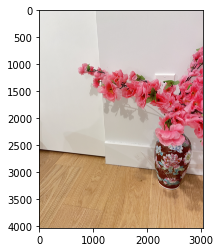

In [ ]:
# the tutorial was used to understand how to used cv2.xfeatures2d. As well, the openCv website was used:
# https://docs.opencv.org/3.4/d5/df7/classcv_1_1xfeatures2d_1_1SURF.html
# this tutorial was looked to understand how to add borders to an image:
# https://www.geeksforgeeks.org/python-opencv-cv2-copymakeborder-method/


# location of the 3 images
loc_Q2 = 'Q2/image'


# load the images
flowers = image_array(loc_Q2,3,'jpeg')


# convert to RGB format
for i in range(3):
  flowers[i] = cv2.cvtColor(flowers[i], cv2.COLOR_BGR2RGB)


# Shift the image to avoid it being cropped in the homography transform
# this is important latter
top, bottom, left, right = 0, 0, 800, 0
borderType = cv2.BORDER_CONSTANT
flower1 = flowers[1].copy()
flowers[1] = cv2.copyMakeBorder(flowers[1], top, bottom, left, right, borderType)[:,:,:]


# create a SIFT object
sift_object = cv2.xfeatures2d.SIFT_create()


# get the SIFT features
sift_features = []
for image in flowers:
  # 1st argument = image; 2nd argument = mask (where to look for keypoints) --> None in our case
  sift_features.append(sift_object.detectAndCompute(image, None))


# display image 0
plt.imshow(flowers[0])

***2.2 Find matching keypoints in image 1 and image 2 and display the 20 best pairs***

(<matplotlib.image.AxesImage at 0x7f3c1bbed0a0>,
 Text(0.5, 1.0, 'Best 20 matches between the two images'))

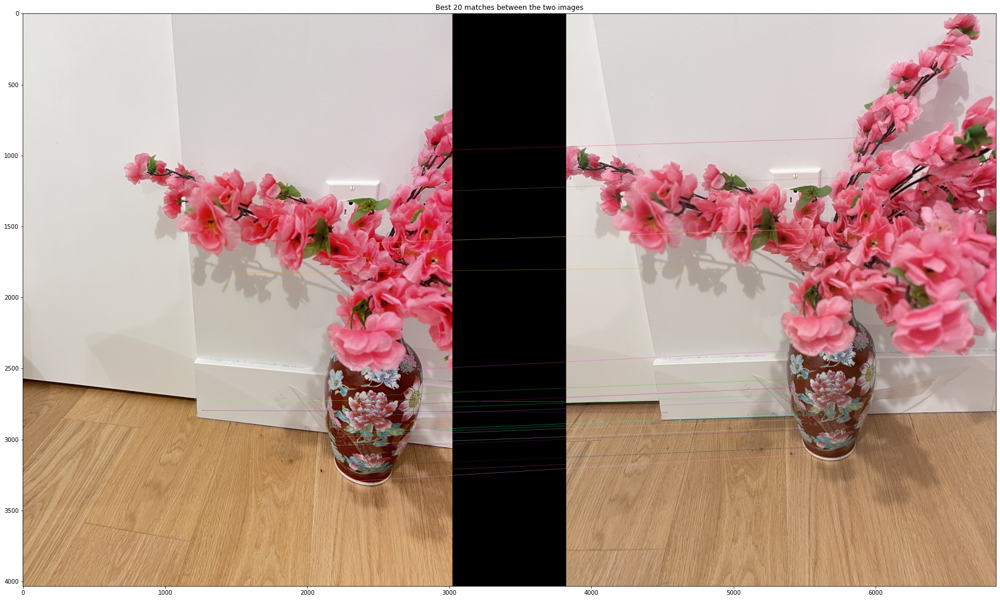

In [ ]:
# create a Brute Force (BF) matcher object
# information about the brute force openCV function was taken from the openCV website:
# https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html
# crossCheck indicates wether two features have to match each other to be considered


# create the Brute Force Matching Object
bf_object = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)


# get the matches between the two images
                        # image 1 descr. (query img)    # image 2 descr. (training img)
matches = list(bf_object.match((sift_features[0])[1],(sift_features[1])[1]))


# sort the 20 best pairs
distance = lambda p:p.distance
matches.sort(key=distance)


# display the top 20 matched keypoints for each image pair
# arguments      -->           image1,          keypoints1,       image2,          keypoints2,    best matches, output image, flags
match_draw = cv2.drawMatches(flowers[0], (sift_features[0])[0], flowers[1], (sift_features[1])[0], matches[:20], None, flags=2)


# display the matches
plt.figure(figsize=(30,30))
plt.imshow(match_draw), plt.title("Best 20 matches between the two images")

***2.3 Using RANSAC Method, find the homography that best describes matches the keypoints and apply the resulting transformation to image 1. Image 2 should not be transformed***

(<AxesSubplot:title={'center':'after stitching'}>,
 Text(0.5, 1.0, 'after stitching'))

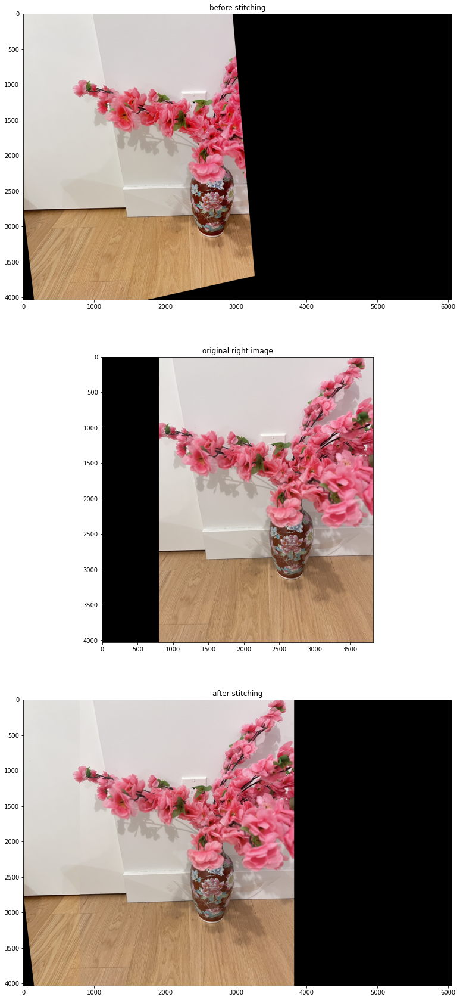

In [ ]:
# define a train and query list for the matches
# the first is inspired from tutorial 4 and the following link:
# https://python.plainenglish.io/opencv-image-stitching-second-part-388784ccd1a
# the following website helped understanding trainIdx and queryIdx:
# https://stackoverflow.com/questions/13318853/opencv-drawmatches-queryidx-and-trainidx


# create two lists for the query and train points
srcPoints = np.float32([((sift_features[0])[0])[m.queryIdx].pt for m in matches])
dstPoints = np.float32([((sift_features[1])[0])[m.trainIdx].pt for m in matches])


# information for the Homography was found here:
# https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#findhomography
# 1st output = homography matrix;  2nd output = mask
# arguments: srcPoints, dstPoints, homology method, threshold value


# find the homography
H,_ = cv2.findHomography(srcPoints, dstPoints, cv2.RANSAC, 5)


# dimensions of output img
w = flowers[0].shape[1] + flowers[0].shape[1]
h = flowers[0].shape[0]


# warp the left image
result = cv2.warpPerspective(flowers[0], H, (w, h))
result2 = result.copy()
result2[0:flowers[1].shape[0], left:flower1.shape[1]+left] = flower1


# display everything :))
plt.figure(figsize = (30,30))
plt.subplot(311), plt.imshow(result), plt.title("before stitching")
plt.subplot(312), plt.imshow(flowers[1]), plt.title("original right image")
plt.subplot(313), plt.imshow(result2), plt.title("after stitching")

***2.4 Stitch the transformed image 1 and the original image 2 together using pyramid image blending. Let us call it image 12 and display it.***

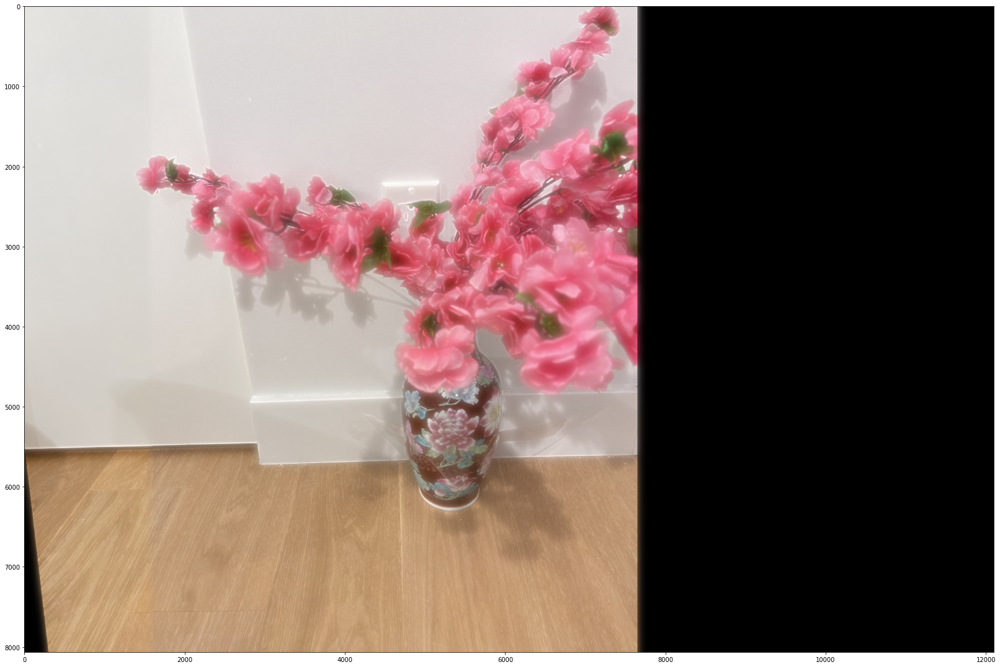

In [ ]:
# the idea to use cv2.pyrdown was taken from this website:
# https://analyticsindiamag.com/image-blending-using-pyramids-in-opencv/#:~:text=Image%20Blending%20techniques%20mainly%20focus,is%20repeatedly%20smoothened%20and%20subsampled.
# more information was obtained from the opencv website:
# https://docs.opencv.org/4.x/dc/dff/tutorial_py_pyramids.html

# cv2.pyrDown blurs an image and downsamples it (smaller image)
# cv2.pyrUp upsamples an image and blurs it (bigger image)


pyramid_size = 5


# initial images to mix
image_1_g = result2[:,left:,:]
image_2_g = result2


# Gaussian Pyramid function
def gaussianPyramid(image):
  gauss_pyr = [image]
  for i in range(pyramid_size):
    image = cv2.pyrDown(image)
    gauss_pyr.append(image)
  return gauss_pyr


# generate gaussian pyramids (left and right images)
gauss_pyr1 = gaussianPyramid(image_1_g)
gauss_pyr2 = gaussianPyramid(image_2_g)


# Laplacian Pyramid function
def laplacianPyramid(gaussianPyramid):

  pyr_size = len(gaussianPyramid)-1
  laplacian = [gaussianPyramid[-1]]

  for i in range(pyr_size,0,-1):
    upper = cv2.pyrUp(gaussianPyramid[i])
    lp = cv2.subtract(gaussianPyramid[i-1], upper)
    laplacian.append(lp)
  return laplacian


# create Laplacian pyramids for left and right images:
laplacian1 = laplacianPyramid(gauss_pyr1)
laplacian2 = laplacianPyramid(gauss_pyr2)


# add the images together one by one
pyr = []
for lap1, lap2 in zip(laplacian1, laplacian2):
  lenght1 = lap1.shape[1]
  lenght2 = lap2.shape[1]
  fs = lenght2-lenght1
  lap2[:,fs:,:] = lap1
  pyr.append(lap2)

# build the smoothed final image
image_12 = pyr[0]
for i in range(1,len(pyr)):
  image_12 = cv2.pyrUp(image_12)
  image_12 = cv2.add(image_12, pyr[i])


# DISPLAY BLENDED IMAGE_12
plt.figure(figsize=(28,28))
plt.imshow(cv2.pyrUp(image_12))

***2.5 Compute the SIFT keypoints and corresponding descriptors for images 12 and 3***

In [ ]:
# compute the SIFT keypoints of the image 12 (those of image 3 were already calculated)

sift_features_img12 = sift_object.detectAndCompute(image_12, None)

***2.6 Find matching keypoints in image 12 and image 3, and display the 20 best pairs***

(<matplotlib.image.AxesImage at 0x7f3c1b958fd0>,
 Text(0.5, 1.0, 'Best 20 matches between the two images'))

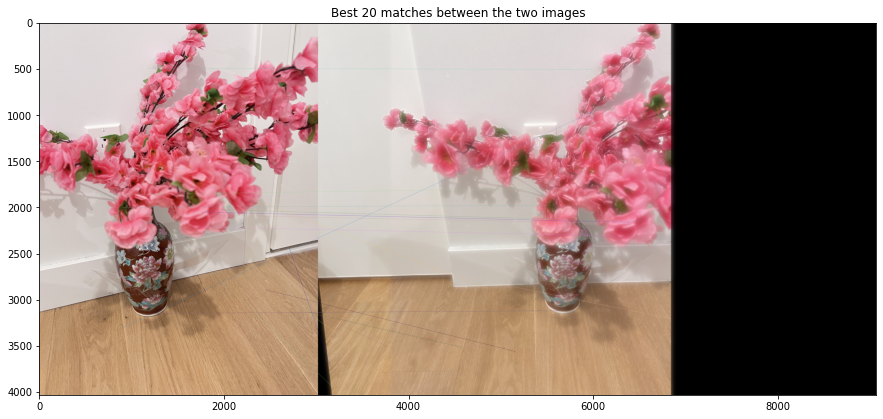

In [ ]:
# create a new Brute Force Matcher object
bf_object2 = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# get the matches between the two images
                                    # image 3               # image 12
matches2 = list(bf_object2.match((sift_features[2])[1],sift_features_img12[1]))

# sort the 20 best pairs
matches2.sort(key=distance)

# display the top 20 matched keypoints for each image pair
# arguments      -->           image12,          keypoints12,      image3,       keypoints3,      best matches, output image, flags
match_draw2 = cv2.drawMatches(flowers[2], (sift_features[2])[0],image_12, sift_features_img12[0], matches2[:20], None, flags=2)

# display the matches
plt.figure(figsize=(15,15))
plt.imshow(match_draw2), plt.title("Best 20 matches between the two images")

***2.7 Find the homography using the RANSAC method, and apply the resulting transformation to image 3. Image 12 should not be transformed.***

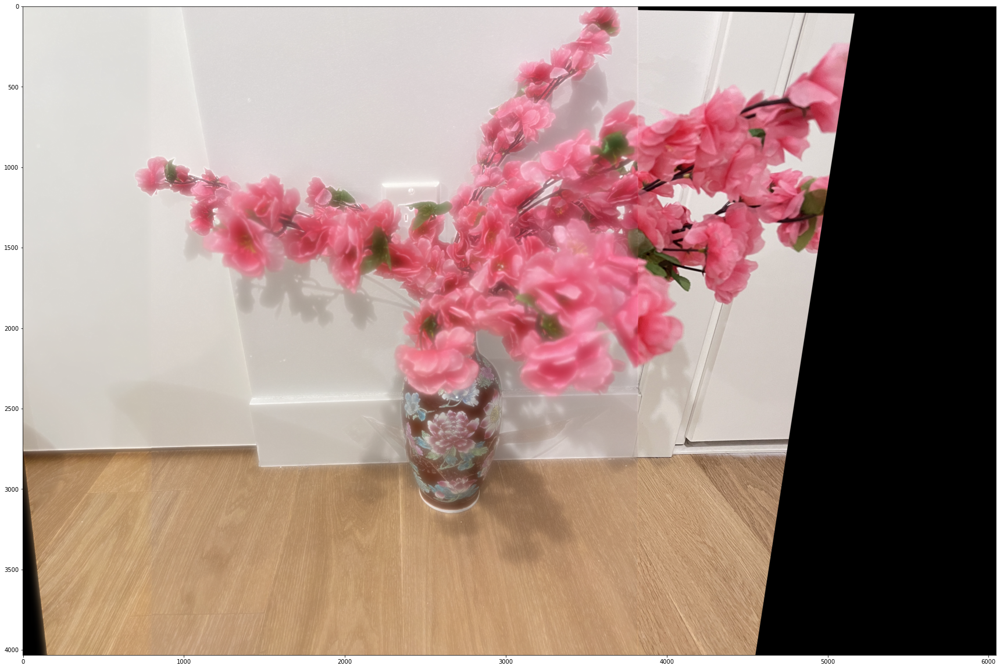

In [ ]:
# create two lists (one for the query and one for the training points)
srcPoints2= np.float32([((sift_features[2])[0])[m.queryIdx].pt for m in matches2])
dstPoints2 = np.float32([(sift_features_img12[0])[m.trainIdx].pt for m in matches2])


# 1st output = homography matrix;  2nd output = mask
# arguments: srcPoints, dstPoints, homology method, threshold value
H2,_ = cv2.findHomography(srcPoints2,dstPoints2, cv2.RANSAC, 5)


# dimensions of output img
w2 = image_12.shape[1]
h2 = image_12.shape[0]


# warp the left image
final = cv2.warpPerspective(flowers[2], H2, (w2, h2))


# eliminate the black right part added in image 12
image_12 = image_12[:,:3824,:]


# inputs for the linear blending in next step
input1 = final.copy()
input2 = image_12.copy()


# output before linear blending
final[:,:image_12.shape[1],:] = image_12
plt.figure(figsize=(30,30))
plt.imshow(final)


***2.8 Stitch image_12 and image 3 together using linear blending***


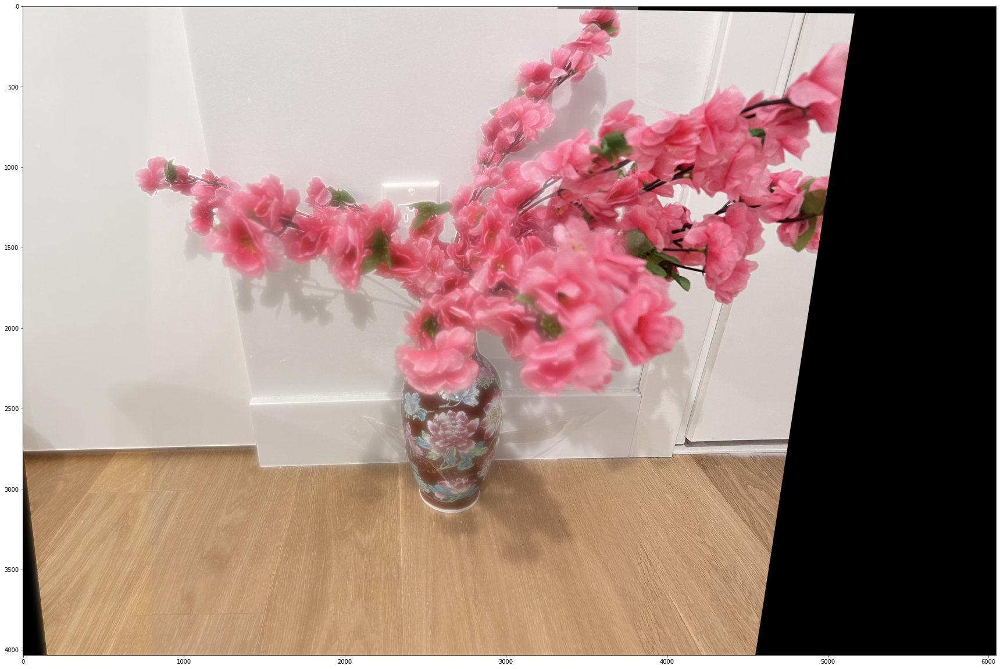

In [ ]:
# linear blending for image_12 and the right-most image
# information on linear blending was found on the opencv website:
# https://docs.opencv.org/3.4/d5/dc4/tutorial_adding_images.html


# alpha and beta control the transparency
alpha = 0.5
beta = 1.0 - alpha
window_size = 500


# get the two distinct images that we want to overlap
im1 = input2[:,input2.shape[1]-window_size:input2.shape[1],:]
im2 = input1[:,image_12.shape[1]-window_size:image_12.shape[1],:]


# blend images together
blend = cv2.addWeighted(im2,alpha,im1,beta,0.0)


# get the homographed image
output = input1.copy()


# add the blended 500 pixels window
output[:,image_12.shape[1]-window_size:image_12.shape[1],:] = blend


# add image_12 to the right
output[:,:image_12.shape[1]-window_size,:] = input2[:,:input2.shape[1]-window_size,:]


# display everything
plt.figure(figsize=(30,30))
plt.imshow(output)

***2.9 Discuss which method you prefer for stitching - pyramid blending or linear blending, and
why?***

On the left side of the image, we can observe that image12 appears significantly blurred due to pyramid blending, resulting in a loss of sharpness. The blending of image 1 and 2 is however really good and the delimiation between the two image has been reduced a lot (this can be observed with the previous output). Conversely, image 3, which was linearly blended, maintains its sharpness and also result in a good blending. Therefore, I would recommend using linear blending instead of pyramid blending. An other advantage of using linear blending instead of pyramid blending is that it is less complex to implement and takes less time and ressources.  However, it is to keep in mind that the specific blending technique better suited for an application will vary depending on the specific application. This should be evaluated on a case by case basis.

# **3. Face detection**

You are given a set of celebrity faces (check ‘Q3/celeb_faces’ folder). Load all images as training
dataset and convert to grayscale image data.

In [ ]:
# get directory with all the face images
directory = os.listdir(path+'/Q3/faces')


# load all the images in grayscale
faces = []
for imagetitle in directory:
  image = cv2.imread(path+'/Q3/faces/'+imagetitle, cv2.IMREAD_GRAYSCALE)
  faces.append(image)

# convert faces to a numpy array
faces = np.array(faces)

Create a PCA function

In [ ]:
class PCA:
  def __init__(self, num_components):
    self.mean = None
    self.eigenvalues = None
    self.eigenvectors = None
    self.X_cent = None
    self.eigenfaces = None
    self.num_components = num_components


  def fit(self, X):

    # get the mean face of the image dataset
    self.mean = np.average(X, axis=0)

    # STEP 1 : center the data
    self.X_cent = X - self.mean

    # STEP 2: calculate the covariance matrix
    covariance = np.cov(self.X_cent)

    # STEP 3: get the eigenvectors and eigenvalues
    self.eigenvalues, self.eigenvectors = np.linalg.eig(covariance)

    # STEP 4: get the eigenvalues and eigenvectors in the descending order
    indices = np.argsort(self.eigenvalues)[::-1]

    # make two sorted lists
    self.eigenvalues = self.eigenvalues[indices]
    self.eigenvectors = self.eigenvectors[:,indices]


  def project(self, X, k):

    # Project the data along all the components
    projected = np.matmul(self.X_cent.T, self.eigenvectors[:,:k])
    return projected


  def reconstruct(self, projected, k):

    # reproject the approximation to the original data space
    reprojected = np.matmul(projected, self.eigenvectors[:,:k].T)

    # to get the reconstruction, add mean face to the result
    reconstructed = reprojected.T + self.mean

    return reconstructed


  def reconstruction_Error(self, X, k):

    # project to k main components
    projected = self.project(X, k)

    # go back to original space
    reconstructed = self.reconstruct(projected, k)

    # calculate the error
    X = X.reshape(400, 38804)
    e = np.linalg.norm(X - reconstructed)/(218*178)

    return e, np.array(reconstructed)


  def error(self, face, k):

    # get the eigenfaces
    self.eigenfaces = np.matmul(self.X_cent.T, self.eigenvectors[:,:self.num_components])

    # flatten the image
    face = face.ravel()

    # substract the mean from the image
    centered = face - self.mean

    # project onto the eigenfaces
    projected = np.matmul(centered.T, self.eigenfaces)

    # reproject along the data space
    reprojected = np.matmul(projected, self.eigenfaces.T)

    # to get the reconstruction, add mean face to the result
    reconstructed = reprojected.T + self.mean

    # calculate how far the reconstruction image is from the ground truth
    error = np.sqrt(np.sum((face - reconstructed)**2, axis=0))

    return error

In [ ]:
# flatten the images to feed them to the PCA function

X = [image.ravel() for image in faces]

***3.1 Eigenface representation***

*3.1.1 Display the mean face of the training dataset*

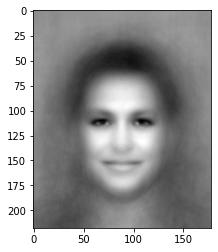

In [ ]:
# information about how to perform PCA was fetched from the scikit-learn website
# additionally, tutorial 5 was helpful to understand PCA
# https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html


pca = PCA(num_components=10)
pca.fit(X)


# show the mean face
plt.imshow((pca.mean).reshape(faces[0].shape), cmap = 'gray')

*3.1.2 Find corresponding eigenvectors and eigenvalues, sort in descending order*

In [ ]:
# fetch eigenvectors and corresponding eigenvalues

# sorting in descending order is done inside the PCA class
eigenvectors = pca.eigenvectors
eigenvalues = pca.eigenvalues

*3.1.3 Print out the first 4 eigenvalues*

In [ ]:
for i in range(5):
  print("eigenvalue {0}: {1}".format(i, eigenvalues[i]))
  print("\n")

eigenvalue 0: 323016.46801558643


eigenvalue 1: 124012.40689942427


eigenvalue 2: 112820.45280470107


eigenvalue 3: 83387.7785017968


eigenvalue 4: 67761.82823038669




*3.1.4 Let k be the first k eigenvectors. Try k = 20, 10, 5 and report the reconstruction error in each case*

the reconstruction error for k=20 is: 3.985415134200771
the reconstruction error for k=10 is: 4.547179419640685
the reconstruction error for k=5 is: 5.094726005787108


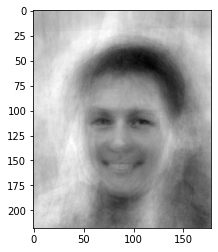

In [ ]:
components = [20,10,5]
image = []
for k in components:
  e, img = pca.reconstruction_Error(faces, k)
  image.append(img)
  print("the reconstruction error for k={0} is: {1}".format(k,e))

im = (image[0])[0].reshape(218,178)
plt.imshow(im, cmap='gray')

Analysis:

Here we can see, as expected that by taking less components, the error in the face reconstruction increases. This is because when we take more components, we capture more variations in the original image, resulting in a more accurate reconstruction. The error here was normalized by the number of pixels in the images.

***3.2 Face detection***

*Using a sliding window, detect face(s) for any test image of your choice. The test image should have at least one face it in. It can also have several faces*

*3.2.1 1. Set k = 10, and display the test image with bounding boxes around all detected face(s) for the best threshold value.*

In [ ]:
# BEFORE RUNNING THIS RE-RUN CELL JUST AFTER "3.FACE DETECTION". The images in the faces variable otherwise are modified
# choose an image. Let's pick the 70th image in our array of faces

img1 = faces[70].copy()

(<matplotlib.image.AxesImage at 0x7f3c04624e80>,
 Text(0.5, 1.0, 'selected image'))

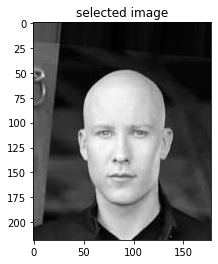

In [ ]:
# plot selected image
img = img1.copy()
img = cv2.resize(img,(218,178))
plt.imshow(img1, cmap='gray'), plt.title("selected image")

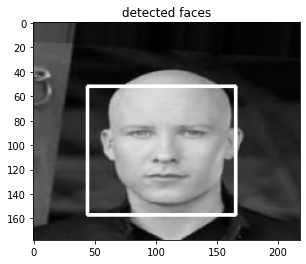

In [ ]:
# the idea to use cascade classifier was used from the eigenface tutorial
# additionally, the openCV website was used as a reference:
# https://docs.opencv.org/3.4/db/d28/tutorial_cascade_classifier.html


# load the cascade classifier
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# array of detected faces
faces = []
faces = face_cascade.detectMultiScale(img, minNeighbors=5)

for (y,x,w,h) in faces:

  # get the section of the face
  face = image[y:y+h,x:x+w]
  face = cv2.resize(face, (218,178))

  # find reconstruction error
  err = pca.error(face,k=10)

  # reconstruction error for the face to be a face
  # the threshold is high but that is because the image is upsampled (so the quality is diminished)
  threshold = 100000000000000

  if err<threshold:

    # draw a rectangle around the face
                        # image   # start   # end    # color    # thick.
    out = cv2.rectangle(img.copy(), (x, y), (y+w, x+h), (255, 0, 0), 2)
    plt.imshow(out, cmap='gray'), plt.title('detected faces')

*3.2.2 Describe how well the method works*

Here, most of the time the method works pretty well. However, in some cases, the box that captures that faces isn't of the same size as the head of the subject of interest and only captures a smaller portion of the face. When scanning through the image, the pca object is used to give the error of reconstruction with k=10 (10 principal components). This error value allows to eliminate regions that are likely not faces with a threshold value. Here the threshold is set pretty high and that is probably caused by the image being upsampled before being sent to the PCA reconstruction function, therefore loosing some little details in the image. To increase the performance of the PCA decomposition (into eigenvectors/eigenvalues) function, a bigger dataset of faces would certainly help.